In [96]:
# Notebook to study the gammas emmited from the 2nubb events
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import os
import sys
import tables as tb
import numpy  as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
from matplotlib.colors import LogNorm  # Import LogNorm for logarithmic color scale
from matplotlib.cm import get_cmap

# Create a sequential colormap
cmap = get_cmap('Spectral')  # You can choose any sequential colormap here

# plt.rcParams["font.size"] = 15
# plt.rcParams["figure.figsize"] = 11,9

In [2]:
# Loading in the file
files = os.listdir("../data/nexus/1bar/")

# Get the single elctron efiles
files = [filename for filename in files if 'single' in filename]
files = sorted(files)

files.append("xesphere_bb_1_bar_2.5_MeV.h5")

print(files)

config_v = []
parts_v  = []
hits_v   = []
energy_v = []
pressure_v = []
 
 
for index, f in enumerate(files):
    config_v.append(pd.read_hdf("../data/nexus/1bar/" + f, 'config'))
    parts_v .append(pd.read_hdf("../data/nexus/1bar/" + f, 'parts'))
    hits_v  .append(pd.read_hdf("../data/nexus/1bar/" + f, 'hits'))

    eventtype = config_v[index][config_v[index]["param_key"] == "/nexus/RegisterGenerator"].iloc[0]['param_value']

    if (eventtype == "Decay0Interface"):
        eventtype = "bb"
        energy = "0nuBB"
        energy_v.append(energy)
    else:
        eventtype = "singleeminus"

        # Then also get the energy
        energy = config_v[index][ config_v[index]["param_key"] == "/Generator/SingleParticle/min_energy"].iloc[0]['param_value']
        energy = [float(num) if '.' in num else int(num) for num in energy.split() if num.replace('.', '', 1).isdigit()]
        energy_v.append(energy[0])
        print(energy[0])

    pressure = config_v[index][ config_v[index]["param_key"] == "/Geometry/XeSphere/pressure"].iloc[0]['param_value']
    pressure = [float(num) if '.' in num else int(num) for num in pressure.split() if num.replace('.', '', 1).isdigit()]
    pressure = f"{int(pressure[0])}_bar"
    pressure_v.append(pressure)

display(config_v[0])


['xesphere_singleeminus_1_bar_0.1_MeV.h5', 'xesphere_singleeminus_1_bar_0.25_MeV.h5', 'xesphere_singleeminus_1_bar_0.5_MeV.h5', 'xesphere_singleeminus_1_bar_1_MeV.h5', 'xesphere_singleeminus_1_bar_2.5_MeV.h5', 'xesphere_bb_1_bar_2.5_MeV.h5']
0.1
0.25
0.5
1
2.5


,param_key,param_value
0,event_type,background
1,num_events,5000
2,saved_events,5000
3,interacting_events,5000
4,/PhysicsList/RegisterPhysics,G4EmStandardPhysics_option4
5,/PhysicsList/RegisterPhysics,G4DecayPhysics
6,/PhysicsList/RegisterPhysics,G4RadioactiveDecayPhysics
7,/PhysicsList/RegisterPhysics,NexusPhysics
8,/PhysicsList/RegisterPhysics,G4StepLimiterPhysics
9,/nexus/RegisterGeometry,XeSphere


In [3]:
## Particles
print(parts_v[0].particle_name.unique())
display(parts_v[0][parts_v[0]["particle_name"] == "gamma"])
display(parts_v[0].head(4))

print(parts_v[5].final_y.min())

['e-' 'gamma']


,event_id,particle_id,particle_name,primary,mother_id,initial_x,initial_y,initial_z,initial_t,final_x,final_y,final_z,final_t,kin_energy,length,creator_proc,final_proc
69,1,67,gamma,0,1,8.533991,-8.670669,-3.280719,0.317612,8.611799,-8.783677,-3.659883,0.318957,0.004097,0.403226,eIoni,phot
127,1,13,gamma,0,1,9.650274,-8.677073,-6.387164,0.128249,11.121579,-6.149103,-8.809410,0.140917,0.004097,3.797715,eIoni,phot
829,12,54,gamma,0,1,-16.608927,-21.493242,-5.186228,0.407666,-16.530539,-21.431309,-5.108063,0.408089,0.000530,0.126847,eIoni,phot
1160,16,5,gamma,0,1,-3.627003,-4.861869,1.723083,0.050476,-5.401085,-0.443635,3.365964,0.067277,0.004413,5.036588,eIoni,phot
1178,16,4,gamma,0,1,-1.225746,-1.397894,0.167255,0.012797,26.637396,37.917873,45.070805,0.232504,0.024712,65.866631,eBrem,phot
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353169,4967,2,gamma,0,1,2.832877,-0.958895,-1.445838,0.029269,1.974323,-3.035975,-2.043508,0.037026,0.004707,2.325637,eIoni,phot
353253,4969,44,gamma,0,1,-6.424746,-3.905910,-9.227575,0.212355,-21.856634,-6.936664,-29.462605,0.297840,0.015780,25.627817,eBrem,phot
354289,4983,56,gamma,0,16,2.949427,4.799014,4.925982,0.076792,1.487681,5.714507,4.500527,0.082717,0.004413,1.776469,eIoni,phot
354586,4986,2,gamma,0,1,-0.869985,-0.488616,0.545167,0.007027,-0.868783,-0.478785,0.557125,0.007079,0.004097,0.015527,eIoni,phot


,event_id,particle_id,particle_name,primary,mother_id,initial_x,initial_y,initial_z,initial_t,final_x,final_y,final_z,final_t,kin_energy,length,creator_proc,final_proc
0,0,1,e-,1,0,0.000000,0.000000,0.000000,0.000000,-1.154172,-1.701858,-1.475052,0.407985,0.100000,50.965977,none,eIoni
1,0,56,e-,0,1,-0.864598,-1.881411,-2.047091,0.370333,-0.864406,-1.881951,-2.047217,0.370551,0.000021,0.000587,eIoni,msc
2,0,55,e-,0,1,-0.864598,-1.881411,-2.047091,0.370333,-0.865524,-1.880899,-2.047544,0.370620,0.000046,0.001612,eIoni,msc
3,0,54,e-,0,1,-0.864598,-1.881411,-2.047091,0.370333,-0.865146,-1.882302,-2.047200,0.370724,0.000021,0.001382,eIoni,msc


-117758.8046875


In [4]:
# Plot the distance of the gammas and bin in a histogram
gammas_v = []

for df in parts_v:
    gammas_v.append(df[df["particle_name"] == "gamma"])


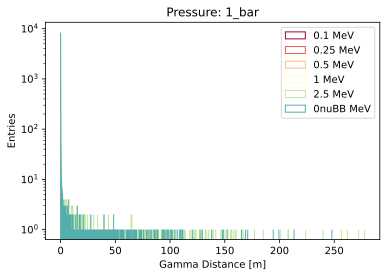

In [103]:
plt.figure()

dist_counts_v = []
dist_bins_v = []

pd.options.mode.chained_assignment = None  # Set it to "None" to disable the warning

for index, g in enumerate(gammas_v):
    deltax = g['final_x'] - g['initial_x']
    deltay = g['final_y'] - g['initial_y']
    deltaz = g['final_z'] - g['initial_z']

    # g['distances'] = np.sqrt(g['final_x']*g['final_x'] + g['final_y']*g['final_y'] + g['final_z']*g['final_z'])/1000
    g['distances'] =  np.sqrt( deltax**2 + deltay**2 + deltaz**2 )/1000
    # print(distances)

    bin_edges = np.linspace(0, g['distances'].max(), 50000);
    # bin_edges = np.linspace(0, 20, 10000);

    counts, bins, _ = plt.hist(g['distances'] , bins = bin_edges, histtype='step', label = f"{energy_v[index]} MeV", color=cmap(index/len(gammas_v)))

    dist_counts_v.append(counts)
    dist_bins_v.append(bins)

plt.xlabel("Gamma Distance [m]")
# plt.xlim(0, gammas_v[4].distances.max()) 
plt.ylabel("Entries")
plt.yscale('log')  # Set the y-axis to logarithmic scale
plt.title(f"Pressure: {pressure_v[0]}")
plt.legend()

In [84]:
display(gammas_v[5][ (gammas_v[5]["kin_energy"] < 0.025)])

,event_id,particle_id,particle_name,primary,mother_id,initial_x,initial_y,initial_z,initial_t,final_x,final_y,final_z,final_t,kin_energy,length,creator_proc,final_proc,distances
116,0,91,gamma,0,2,393.378784,-544.572266,1026.953491,9.274337,393.283051,-544.405579,1026.803833,9.275149,0.002487,0.243594,eBrem,phot,0.000244
285,0,25,gamma,0,2,-143.312943,-97.369049,645.957703,3.254638,-143.571777,-97.324364,646.243469,3.255933,0.001780,0.388153,eBrem,phot,0.000388
684,1,232,gamma,0,85,-175.692902,-576.210999,-573.878296,9.073565,-175.705917,-576.146301,-573.945374,9.073879,0.000543,0.094099,eIoni,phot,0.000094
765,1,241,gamma,0,72,-253.188675,-291.697876,-536.234619,7.790496,-253.134766,-291.670624,-536.142456,7.790864,0.000920,0.110178,eIoni,phot,0.000110
1052,1,542,gamma,0,507,-92.321701,19.308445,-155.567245,0.976211,-94.476006,26.680027,-155.582962,1.001829,0.005034,7.679942,eIoni,phot,0.007680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3426255,4999,191,gamma,0,49,241.806046,-57.595268,337.796234,3.888093,239.306091,-60.035488,336.511719,3.900508,0.004097,3.722154,eIoni,phot,0.003722
3426434,4999,292,gamma,0,6,1.605342,5.615665,144.951965,0.594681,16.141035,35.849701,277.171844,1.049693,0.023065,136.409241,eBrem,phot,0.136409
3426597,4999,467,gamma,0,1,-295.167542,-304.811646,482.850098,6.926632,-317.049011,-285.852478,608.247375,7.355917,0.022926,128.696213,eBrem,phot,0.128696
3426599,4999,569,gamma,0,467,-317.049011,-285.852478,608.247375,7.355917,-318.691040,-285.820343,607.891663,7.361522,0.005034,1.680426,phot,phot,0.001680


In [7]:
# Make a 2D plot of the gamma energy vs gamma distance

#Separate out the types of gammas
# other   = gammas[  gammas['creator_proc'] == "none"]
# eIoni   = gammas[  gammas['creator_proc'] == "eIoni"]
# eBrem   = gammas[  gammas['creator_proc'] == "eBrem"]
# phot    = gammas[  gammas['creator_proc'] == "phot"]
# compt   = gammas[  gammas['creator_proc'] == "compt"]
# conv    = gammas[  gammas['creator_proc'] == "conv"]
# annihil = gammas[  gammas['creator_proc'] == "annihil"]

eBrems = []

plt.figure(figsize=(18, 10))  # Adjust the figure size as needed

for index, g in enumerate(gammas_v):
    eBrems.append(g[ g['creator_proc'] == "eBrem"])

    plt.subplot(2, 3, index+1)
    plt.hist2d(eBrems[index]['kin_energy'],   eBrems[index]['distances'],  bins=(100,100), norm=LogNorm(), cmap = "viridis");

    # Create a color bar to the right of the plot
    cbar = plt.colorbar(label='Events', location='right')

    # plt.xlim(0, 0.2)
    # plt.ylim(0,5)
    plt.xlabel("Kinetic Energy [MeV]")
    plt.ylabel("Brem Distance [m]");
    plt.title( f"E = {energy_v[index]} MeV, {pressure_v[0]}")


In [8]:
# Print stupendous events
print(eBrems[4][eBrems[4]['distances'] > 40].event_id.unique())

[  21   29  108  114  139  163  169  204  228  230  244  298  311  344
  350  368  437  444  461  491  501  518  527  530  532  540  553  578
  630  649  668  674  682  697  736  747  788  792  815  818  828  834
  843  853  861  875  879  912  920  930  938  941  944  962  964 1003
 1028 1035 1054 1057 1069 1080 1097 1107 1130 1163 1166 1222 1239 1240
 1243 1285 1295 1357 1359 1363 1366 1372 1389 1421 1424 1452 1467 1469
 1487 1489 1528 1536 1553 1572 1573 1584 1599 1656 1662 1682 1696 1702
 1705 1786 1788 1810 1819 1833 1848 1895 1935 1994 2002 2041 2060 2104
 2109 2141 2146 2187 2191 2251 2260 2270 2290 2298 2316 2340 2343 2387
 2392 2409 2429 2434 2462 2471 2484 2514 2516 2519 2524 2537 2539 2545
 2556 2588 2593 2606 2614 2628 2651 2671 2688 2714 2741 2747 2767 2794
 2869 2885 2891 2910 2971 2976 3045 3085 3098 3112 3136 3204 3218 3222
 3226 3243 3256 3311 3320 3326 3327 3333 3339 3386 3395 3411 3413 3424
 3437 3445 3460 3478 3482 3488 3491 3540 3542 3563 3566 3575 3579 3582
 3608 

,event_id,particle_id,particle_name,primary,mother_id,initial_x,initial_y,initial_z,initial_t,final_x,final_y,final_z,final_t,kin_energy,length,creator_proc,final_proc,distances
600,2,48,gamma,0,1,-170.285706,104.340164,-48.319416,3.448412,2420.047852,-657.950134,-1011.853516,51.576763,0.232572,14428.517578,eBrem,phot,2.866934
908,3,121,gamma,0,1,-1.444307,-4.584139,-115.807945,5.479174,3.561841,-12.441215,-115.044518,5.510355,0.011038,9.347619,eBrem,phot,0.009348
1006,3,59,gamma,0,1,-9.811696,-22.873472,-145.148727,4.888283,78.850281,-59.624729,-157.476624,5.211059,0.026940,96.765587,eBrem,phot,0.096766
1048,3,47,gamma,0,1,55.266022,-9.597631,-73.967628,3.902055,53.563461,-6.820744,-74.416954,3.913023,0.003166,3.288114,eBrem,phot,0.003288
2097,7,43,gamma,0,1,296.185333,-505.120575,-169.081604,3.212987,295.124481,-500.611969,-176.580978,3.242389,0.012522,8.814393,eBrem,phot,0.008814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1437666,4996,18,gamma,0,1,141.738342,-203.725494,-107.661018,1.246346,208.962570,-408.696198,-286.562408,2.181146,0.056174,280.245972,eBrem,phot,0.280246
1437730,4996,7,gamma,0,1,132.340515,-59.709579,-58.809998,0.611295,-282.441193,-575.684875,-61.430317,2.819583,0.113010,662.028137,eBrem,phot,0.662028
1438038,4997,30,gamma,0,1,-173.254776,175.710068,3.684668,2.218132,-194.619995,202.420975,-39.254719,2.401250,0.014121,54.897511,eBrem,phot,0.054898
1438158,4998,59,gamma,0,1,-199.373703,266.696686,-22.124989,4.298590,-193.196182,262.620728,-22.407387,4.323295,0.010410,7.406423,eBrem,phot,0.007406


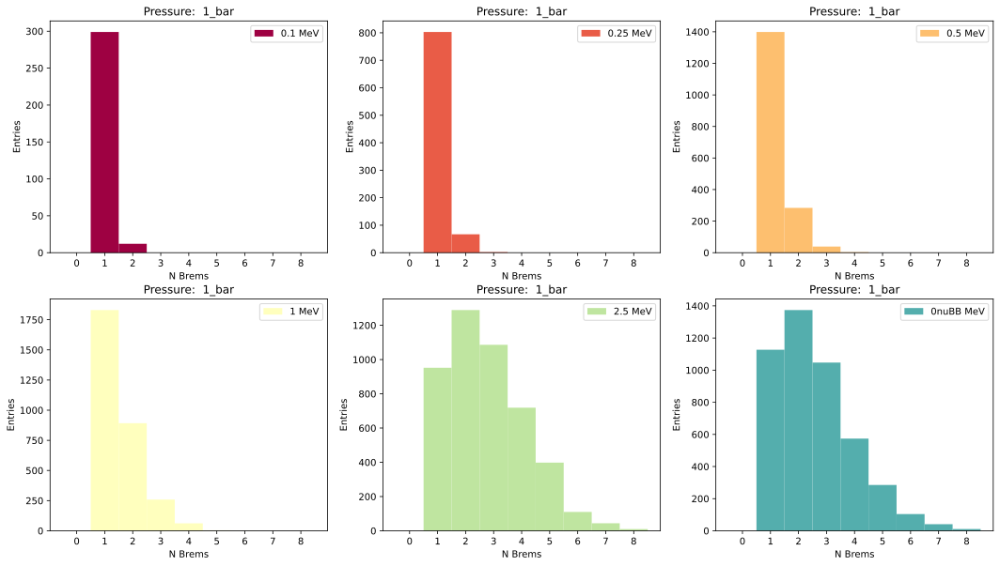

In [9]:
# Plt the bremstrahlung frequency per event

display(eBrems[3])

df = eBrems[3]

bin_edges = np.arange(-0.5, 9.5, 1)
bin_centers = np.arange(0, 9, 1)


plt.figure(figsize=(18, 10))  # Adjust the figure size as needed

for index, df in enumerate(eBrems):

    eventids = df.event_id.unique()

    n_photon_v = []

    for e in eventids:
        temp_df = df[ df["event_id"] == e]
        n_photon_v.append(len(temp_df))

    plt.subplot(2, 3, index+1)
    plt.hist(n_photon_v, bins = bin_edges, label = f"{energy_v[index]} MeV", color=cmap(index/len(eBrems)))

    plt.xlabel("N Brems")
    plt.ylabel("Entries")
    plt.legend()
    plt.xticks(bin_centers) 
    plt.title( f"Pressure:  {pressure_v[0]}")


In [113]:
# Plot the gamma ray energy

plt.figure(figsize=(18, 10))  # Adjust the figure size as needed

counts_v = []
bins_v = []


for index, df in enumerate(eBrems):

    n_photon_v = []
    plt.subplot(2, 3, index+1)
    bin_edges = np.linspace(0, df["kin_energy"].max(), 100);
    # bin_edges = np.linspace(0, 0.03, 100);
    counts, bins, _  = plt.hist(df["kin_energy"], bins = bin_edges, label = f"{energy_v[index]} MeV", color=cmap(index/len(eBrems)));
    counts_v.append(counts)
    bins_v.append(bins)

    plt.xlabel("Brem Energy [MeV]")
    plt.ylabel("Entries")
    plt.title( f"Pressure:  {pressure_v[0]}")
    plt.legend()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

KeyError: 'default'

0
1
2
3
4
5


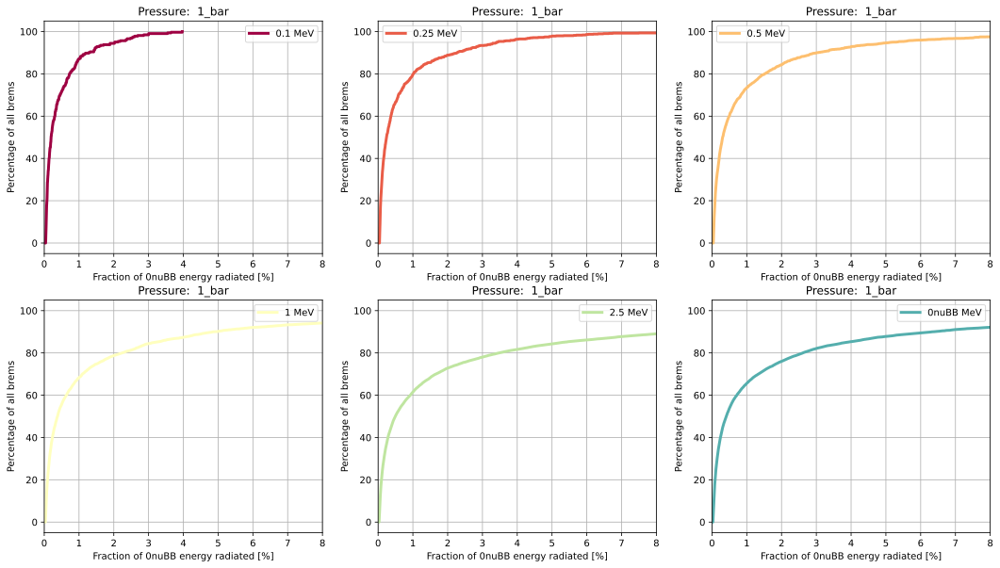

In [106]:

cum_sum = []

cumalative = 0

# Loop over the bin edges and integrate
for index, c in enumerate(counts_v):
    print(index)

    cum_sum.append(np.zeros(len(c)))
    cumalative = 0

    for j, sum_ in enumerate(c):
        cumalative+=sum_
        cum_sum[index][j]+=cumalative

    cum_sum[index]/=np.sum(c)
    cum_sum[index]*=100


plt.figure(figsize=(18, 10))  
for index, sums in enumerate(cum_sum):
    plt.subplot(2, 3, index+1)
    bin_centers = [(bins_v[index][i] + bins_v[index][i+1]) / 2 for i in range(len(bins_v[index]) - 1)]
    bin_centers = np.array(bin_centers)
    plt.plot(100*bin_centers/2.458, sums, label = f"{energy_v[index]} MeV", color=cmap(index/len(cum_sum)), linewidth = 3)
   
    plt.xlim(0, 8)
    plt.xlabel("Fraction of 0nuBB energy radiated [%]")
    plt.ylabel("Percentage of all brems")
    plt.title( f"Pressure:  {pressure_v[0]}")
    plt.legend()
    plt.grid(True)


0
1
2
3
4
5


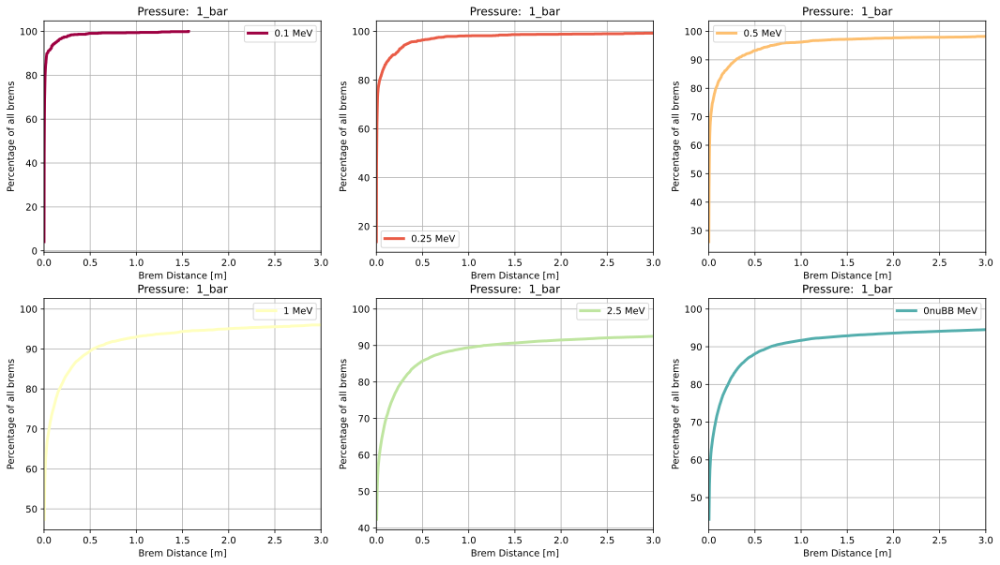

In [105]:
# Same again but with bremstrahlung distance

cum_sum = []

cumalative = 0

# Loop over the bin edges and integrate
for index, c in enumerate(dist_counts_v):
    print(index)

    cum_sum.append(np.zeros(len(c)))
    cumalative = 0

    for j, sum_ in enumerate(c):
        cumalative+=sum_
        cum_sum[index][j]+=cumalative

    cum_sum[index]/=np.sum(c)
    cum_sum[index]*=100


plt.figure(figsize=(18, 10))  
for index, sums in enumerate(cum_sum):
    plt.subplot(2, 3, index+1)
    bin_centers = [(dist_bins_v[index][i] + dist_bins_v[index][i+1]) / 2 for i in range(len(dist_bins_v[index]) - 1)]
    plt.plot(bin_centers, sums, label = f"{energy_v[index]} MeV", color=cmap(index/len(cum_sum)), linewidth = 3)
   

    plt.xlim(0, 3)
    plt.xlabel("Brem Distance [m]")
    plt.ylabel("Percentage of all brems")
    plt.title( f"Pressure:  {pressure_v[0]}")
    plt.legend()
    plt.grid(True)


In [115]:
# get the hits of a specific event
category = 5

evt      = 10
evt_hits = hits_v[category][(hits_v[category].event_id == evt)]
x = evt_hits.x/1000
y = evt_hits.y/1000
z = evt_hits.z/1000
t = evt_hits.time
e = evt_hits.energy*1000

display(gammas_v[category][gammas_v[category]["event_id"] == evt])
display(parts_v[category][(parts_v[category]["event_id"] == evt) & (parts_v[category]["primary"] == 1)])

,event_id,particle_id,particle_name,primary,mother_id,initial_x,initial_y,initial_z,initial_t,final_x,final_y,final_z,final_t,kin_energy,length,creator_proc,final_proc,distances


,event_id,particle_id,particle_name,primary,mother_id,initial_x,initial_y,initial_z,initial_t,final_x,final_y,final_z,final_t,kin_energy,length,creator_proc,final_proc
7188,10,2,e-,1,0,0.0,0.0,0.0,0.0,-20.719200,-1222.981689,110.984604,9.003437,1.534309,2336.993652,none,eIoni
7580,10,1,e-,1,0,0.0,0.0,0.0,0.0,-14.561546,-69.184311,299.080566,3.027132,0.923521,670.188354,none,eIoni


In [116]:
%matplotlib widget
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('x [m]')
ax.set_ylabel('y [m]')
ax.set_zlabel('z [m]')

x_range = (x.max()-x.min()) * 0.5
y_range = (y.max()-y.min()) * 0.5
z_range = (z.max()-z.min()) * 0.5
mid_x = (x.max()+x.min()) * 0.5
mid_y = (y.max()+y.min()) * 0.5
mid_z = (z.max()+z.min()) * 0.5
ax.set_xlim(mid_x - x_range, mid_x + x_range)
ax.set_ylim(mid_y - y_range, mid_y + y_range)
ax.set_zlim(mid_z - z_range, mid_z + z_range)

# ax.set_xlim(-0.2, 0.2)
# ax.set_ylim(-0.2, 0.2)
# ax.set_zlim(-0.2, 0.2)

fig = plt.gcf()  # Get the current figure
fig.patch.set_facecolor('white')  # Set the background color to white

p = ax.scatter(x,y,z,cmap='viridis',c=e, s=1, zorder=2) #coolwarm
ax.scatter(0,0,0,c="red", s=5, zorder=1) #coolwarm
cb = fig.colorbar(p, ax=ax)
cb.set_label('Energy [keV]')
ax.set_title(f"Event: {evt}")
plt.savefig(f"../plots/events/event_{evt}_P{pressure_v[0]}_E_{energy_v[category]}.png", dpi = 800, transparent=False)

plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

KeyError: 'default'

KeyError: 'default'

KeyError: 'default'

KeyError: 'default'

KeyError: 'default'

In [15]:
r0 = np.array([0.011529, 0.093824])
r1 = np.array([0.022936, 0.170519])
r2 = np.array([0.0067319, 0.249209])

v1 = np.subtract(r1, r0)
v2 = np.subtract(r2, r1)
print(v1, v2)

v1_mag = np.sqrt(v1[0]**2 + v1[1]**2)
v2_mag = np.sqrt(v2[0]**2 + v2[1]**2)
print(v1_mag, v2_mag)

costheta =  (v1[0]*v2[0] + v1[1]*v2[1]) / ( v1_mag * v2_mag )
print(costheta)
print(np.arccos(costheta) * 180/np.pi)


[0.011407 0.076695] [-0.0162041  0.07869  ]
0.07753865277395526 0.08034107888751557
0.9391207540611964
20.09558106207793


In [112]:
# Estimate the ranges for a gamma in 1 bar xenon

# Sigma [MBarnes], Percentage of events contained
def gamma_range(sigma, prob):
    return 0.01*1/(26.87*sigma)*np.log(1/(1 - 0.01*prob))

# Sigma [MBarnes], Percentage of events contained
def gamma_containment(sigma, distance):
    return 100* (1 - np.exp(-26.87*sigma*distance))


Gamma_energies = [10, 100, 200, 300, 400, 1000]
absorb_cross = [2e-2, 4e-4, 1e-4, 4e-5, 3e-5, 0.5e-5]

print(gamma_range(4e-4, 90))

plt.figure(figsize=(9,6))
plt.plot(Gamma_energies, gamma_range(np.array(absorb_cross), np.full(len(absorb_cross), 90)), linewidth = 3, color = cmap(0));
plt.xlabel("Brem Energy [keV]",fontsize=20)
plt.ylabel("Brem distance 90% containment [m]",fontsize=20);
plt.yticks(fontsize=20);  # Set the y tick label size to 12
plt.xticks(fontsize=20);  # Set the x tick label size to 12


plt.figure(figsize=(9,6))
plt.plot(Gamma_energies, gamma_containment(np.array(absorb_cross), np.full(len(absorb_cross), 250)  ), linewidth = 3, color = cmap(0));
plt.xlabel("Brem Energy [keV]",fontsize=20)
plt.ylabel("Percentage of events contained in 2.5 m [%]",fontsize=20);
plt.yticks(fontsize=20);  # Set the y tick label size to 12
plt.xticks(fontsize=20);  # Set the x tick label size to 12


2.1423381959378918


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

KeyError: 'default'

KeyError: 'default'